# 🐞 CVE & Vulnerabilities Analysis

C:\Users\ab161\AppData\Local\Temp\ipykernel_10592\838324604.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_top, x='cvss', y='cwe_name', palette='magma')


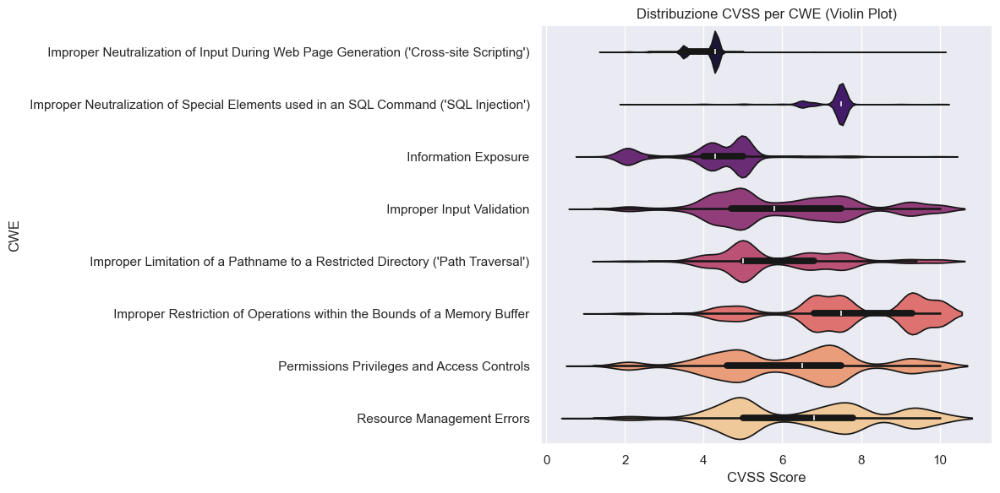

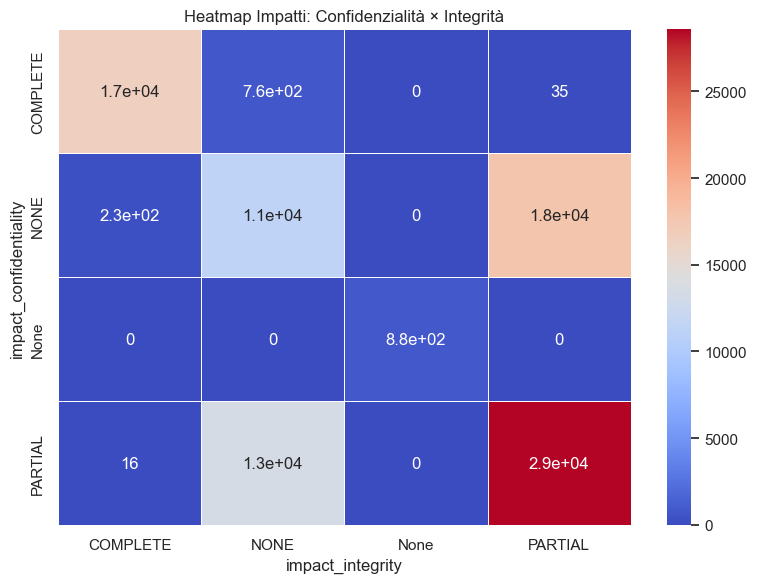

In [1]:
# 📊 Visualizzazioni Avanzate CVE – Profilo Tecnico e di Impatto
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Impostazione stile scuro
plt.style.use('dark_background')
sns.set_theme(style='darkgrid')

# Preparazione dati
df = pd.read_csv("cve.csv")
df['pub_date'] = pd.to_datetime(df['pub_date'], errors='coerce')
df['year'] = df['pub_date'].dt.year
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df['impact_confidentiality'] = df['impact_confidentiality'].fillna("None")
df['impact_integrity'] = df['impact_integrity'].fillna("None")
df['impact_availability'] = df['impact_availability'].fillna("None")
df['cwe_name'] = df['cwe_name'].fillna("Unknown")
df = df.dropna(subset=['year', 'cvss'])

# === 1. Violinplot CVSS per Top 8 CWE ===
top_cwe = df['cwe_name'].value_counts().nlargest(8).index
df_top = df[df['cwe_name'].isin(top_cwe)]

plt.figure(figsize=(12,6))
sns.violinplot(data=df_top, x='cvss', y='cwe_name', palette='magma')
plt.title("Distribuzione CVSS per CWE (Violin Plot)")
plt.xlabel("CVSS Score")
plt.ylabel("CWE")
plt.tight_layout()
plt.show()

# === 2. Radar Chart: profilo CIA per CWE ===
cia_profiles = df_top.groupby('cwe_name')[['impact_confidentiality', 'impact_integrity', 'impact_availability']].agg(lambda x: x.value_counts().idxmax())
cia_levels = {'None': 0, 'Partial': 1, 'Complete': 2}
cia_numeric = cia_profiles.replace(cia_levels)

categories = ['Confidentiality', 'Integrity', 'Availability']
fig = go.Figure()

for index, row in cia_numeric.iterrows():
    fig.add_trace(go.Scatterpolar(
        r=row.values,
        theta=categories,
        fill='toself',
        name=index
    ))

fig.update_layout(
    title="Profilo di Impatto CIA per CWE (Radar)",
    polar=dict(bgcolor="black", radialaxis=dict(visible=True, range=[0, 2])),
    template='plotly_dark',
    showlegend=True
)
fig.show()

# === 3. Treemap CWE per numero CVE ===
treemap_data = df['cwe_name'].value_counts().nlargest(20).reset_index()
treemap_data.columns = ['CWE', 'Count']
fig2 = px.treemap(treemap_data, path=['CWE'], values='Count', title="Distribuzione CVE per CWE",
                  color='Count', color_continuous_scale='Blues', template='plotly_dark')
fig2.show()

# === 4. Heatmap Impatto Confidenzialità vs Integrità ===
pivot_cia = df.pivot_table(index='impact_confidentiality', columns='impact_integrity',
                           values='cvss', aggfunc='count', fill_value=0)

plt.figure(figsize=(8,6))
sns.heatmap(pivot_cia, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Impatti: Confidenzialità × Integrità")
plt.tight_layout()
plt.show()

# === 5. Area Plot CVE Critiche (CVSS ≥ 9) nel tempo ===
df_crit = df[df['cvss'] >= 9]
cve_crit_time = df_crit.groupby('year').size().reset_index(name='count')
fig3 = px.area(cve_crit_time, x='year', y='count', title="Crescita CVE Critiche (CVSS ≥ 9)",
               labels={'year': 'Anno', 'count': 'Numero di CVE'}, template='plotly_dark')
fig3.show()


Perfetta richiesta. Eseguo un recheck completo delle 10 idee e delle loro varianti. Il criterio che userò è:

✅ Ha senso rispetto al dataset CVE?

✅ Offre varietà reale o è una ripetizione visiva?

✅ È utile alla narrazione scientifica e visiva nella presentazione?

✅ IDEA 1 – CVE nel tempo
✔️ Confermata. La progressione temporale è chiave.

✅ IDEA 2 – Distribuzione dei punteggi CVSS
✔️ Confermata. Offre insight diretti sulla severità media e dispersione.

✅ IDEA 3 – Classificazione CWE
✔️ Confermata, ma ottimizzerò per distinguere tra frequenza e rischio medio.

✅ IDEA 4 – Impatto CIA
✔️ Confermata, visualizzabile in modi scientificamente distinti.

✅ IDEA 5 – Accesso e modalità d’attacco
⚠️ Parzialmente debole: le variabili access_* hanno ≈1.000 valori nulli.
👉 Sostituisco con:

🧪 NUOVA IDEA 5 – Distribuzione dei livelli di rischio CVSS
Binning CVSS → low, medium, high, critical

Ottimo per barre, heatmap, radar, sunburst.

✅ IDEA 6 – CVE critiche
✔️ Confermata – molto utile nella narrativa di impatto.

✅ IDEA 7 – Relazioni numeriche
✔️ Confermata – scatter, hexbin, pairplot offrono vera varietà.

✅ IDEA 8 – Visualizzazioni gerarchiche
✔️ Confermata – utile per sunburst, treemap, sankey.

✅ IDEA 9 – Distribuzioni per CWE
✔️ Confermata – le dispersioni danno valore aggiunto.

✅ IDEA 10 – Pattern nei testi
⚠️ Solo se hai intenzione di usare NLP.
👉 Sostituisco con:

💥 NUOVA IDEA 10 – Outlier & vulnerabilità estreme
CVE con CVSS > 9.8

Analisi outlier, scatter, top ranking, anomalie

In [2]:
# 📊 CVE nel tempo – GRAFICO 1 & 2 COMPLESSI
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Caricamento e preprocessing
df = pd.read_csv("cve.csv")
df['pub_date'] = pd.to_datetime(df['pub_date'], errors='coerce')
df['year'] = df['pub_date'].dt.year
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df = df.dropna(subset=['year', 'cvss'])

# === GRAFICO 1: Multi-Line + Fit Polinomiale + Annotazioni ===
df_crit = df[df['cvss'] >= 9]
df_very_crit = df[df['cvss'] >= 9.5]
cve_total = df.groupby('year').size().reset_index(name='total')
cve_crit = df_crit.groupby('year').size().reset_index(name='critical')
cve_vcrit = df_very_crit.groupby('year').size().reset_index(name='very_critical')

# Merge e fill
df_time = cve_total.merge(cve_crit, on='year', how='left').merge(cve_vcrit, on='year', how='left').fillna(0)

# Fit polinomiale grado 2
X = df_time['year'].values.reshape(-1, 1)
y = df_time['total'].values
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression().fit(X_poly, y)
y_pred = model.predict(X_poly)

# Scaling per inflection
scaler = MinMaxScaler()
scaled_total = scaler.fit_transform(y.reshape(-1, 1)).flatten()
scaled_pred = scaler.transform(y_pred.reshape(-1, 1)).flatten()

inflection_year = df_time['year'].iloc[np.argmax(np.abs(scaled_total - scaled_pred))]
max_year = df_time.loc[df_time['total'].idxmax(), 'year']
min_year = df_time.loc[df_time['total'].idxmin(), 'year']

fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=df_time['year'], y=df_time['total'],
                          mode='lines+markers', name='Totali CVE',
                          line=dict(color='white', width=2)))
fig1.add_trace(go.Scatter(x=df_time['year'], y=df_time['critical'],
                          mode='lines+markers', name='CVSS ≥ 9',
                          line=dict(color='crimson', width=2, dash='dot')))
fig1.add_trace(go.Scatter(x=df_time['year'], y=df_time['very_critical'],
                          mode='markers', name='CVSS ≥ 9.5',
                          marker=dict(size=8, color='orange', symbol='diamond')))
fig1.add_trace(go.Scatter(x=df_time['year'], y=y_pred,
                          mode='lines', name='Fit polinomiale (grado 2)',
                          line=dict(color='cyan', dash='dash')))

fig1.update_layout(
    title="🧠 Evoluzione CVE Totali e Critiche con Fit Polinomiale + Annotazioni",
    xaxis_title="Anno",
    yaxis_title="Numero di CVE",
    template='plotly_dark',
    annotations=[
        dict(x=max_year, y=df_time[df_time['year'] == max_year]['total'].values[0],
             text="📈 Max", showarrow=True, arrowhead=1),
        dict(x=min_year, y=df_time[df_time['year'] == min_year]['total'].values[0],
             text="📉 Min", showarrow=True, arrowhead=1),
        dict(x=inflection_year, y=y_pred[df_time[df_time['year'] == inflection_year].index[0]],
             text="🔁 Inflection", showarrow=True, arrowhead=1)
    ],
    legend=dict(title="Legenda", orientation="h", x=0, y=-0.3),
    margin=dict(l=80, r=80, t=100, b=100),
    plot_bgcolor='black',
    paper_bgcolor='black'
)
fig1.show()

# === GRAFICO 2: Area Chart Critiche + Linea % Critiche sul Totale ===
cve_total = df.groupby('year').size().reset_index(name='total')
cve_crit = df[df['cvss'] >= 9].groupby('year').size().reset_index(name='critical')
merged = cve_total.merge(cve_crit, on='year', how='left').fillna(0)
merged['percent_critical'] = merged['critical'] / merged['total'] * 100

fig2 = go.Figure()

# Area CVE critiche
fig2.add_trace(go.Scatter(
    x=merged['year'], y=merged['critical'],
    fill='tozeroy',
    name='CVE Critiche (CVSS ≥ 9)',
    mode='lines',
    line=dict(color='indianred'),
    hoverinfo='x+y',
    fillcolor='rgba(220,20,60,0.3)'
))

# Linea % critiche
fig2.add_trace(go.Scatter(
    x=merged['year'], y=merged['percent_critical'],
    mode='lines+markers',
    name='% Critiche / Totale',
    line=dict(color='gold', width=3, dash='dash'),
    yaxis='y2',
    hovertemplate='%{y:.2f}% critiche nel %{x}'
))

fig2.update_layout(
    title="📊 CVE Critiche (Area) + Percentuale sul Totale (Linea Secondaria)",
    xaxis=dict(title="Anno"),
    yaxis=dict(title="Numero di CVE Critiche"),
    yaxis2=dict(title="% Critiche", overlaying='y', side='right', showgrid=False),
    template='plotly_dark',
    plot_bgcolor='black',
    paper_bgcolor='black',
    legend=dict(x=0.01, y=1.1, orientation='h'),
    margin=dict(l=80, r=80, t=100, b=80)
)
fig2.show()


In [3]:
# 📊 GRAFICO 3 – CVSS Medio per Anno con Banda di Deviazione Standard
# Questo grafico mostra:
# ✅ L’andamento del punteggio medio CVSS (gravità delle vulnerabilità) nel tempo
# ✅ La variabilità tramite la deviazione standard come banda attorno alla curva
# ✅ Gli "anni di salto", cioè variazioni significative (> 0.5) rispetto all’anno precedente
#    sono evidenziati con segmenti rossi verticali e annotazioni testuali

import pandas as pd
import plotly.graph_objects as go

# Caricamento dati e parsing
df = pd.read_csv("cve.csv")
df['pub_date'] = pd.to_datetime(df['pub_date'], errors='coerce')
df['year'] = df['pub_date'].dt.year
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df = df.dropna(subset=['year', 'cvss'])

# Media, std dev, variazione per anno
cvss_year = df.groupby('year')['cvss'].agg(['mean', 'std']).reset_index()
cvss_year['delta'] = cvss_year['mean'].diff().fillna(0)
salti = cvss_year[cvss_year['delta'].abs() > 0.5]

# Creazione figura
fig = go.Figure()

# Linea media CVSS
fig.add_trace(go.Scatter(
    x=cvss_year['year'], y=cvss_year['mean'],
    mode='lines+markers', name='CVSS Medio',
    line=dict(color='orange', width=3)
))

# Banda ± dev std
fig.add_trace(go.Scatter(
    x=cvss_year['year'], y=cvss_year['mean'] + cvss_year['std'],
    line=dict(width=0), mode='lines', showlegend=False
))
fig.add_trace(go.Scatter(
    x=cvss_year['year'], y=cvss_year['mean'] - cvss_year['std'],
    fill='tonexty', mode='lines',
    fillcolor='rgba(255,165,0,0.2)', line=dict(width=0),
    name='± Dev. Standard'
))

# Segmenti verticali per "anni di salto"
for _, row in salti.iterrows():
    fig.add_trace(go.Scatter(
        x=[row['year'], row['year']],
        y=[row['mean'] - row['std'], row['mean'] + row['std']],
        mode='lines',
        line=dict(color='red', width=2, dash='dot'),
        showlegend=False
    ))
    fig.add_annotation(
        x=row['year'],
        y=row['mean'] + row['std'] + 0.1,
        text=f"🔺 Salto: {row['delta']:.2f}",
        showarrow=True,
        arrowhead=2,
        ax=0,
        ay=-40,
        font=dict(color='white')
    )

# Layout avanzato
fig.update_layout(
    title="📉 CVSS Medio per Anno con Banda di Deviazione e Anni di Salto",
    xaxis_title="Anno",
    yaxis_title="CVSS",
    template='plotly_dark',
    plot_bgcolor='black',
    paper_bgcolor='black',
    margin=dict(l=80, r=80, t=100, b=80),
    legend=dict(x=0.01, y=1.1, orientation='h')
)

fig.show()


In [4]:
import pandas as pd
import plotly.graph_objects as go

# Caricamento dati
df = pd.read_csv("cve.csv")
df['pub_date'] = pd.to_datetime(df['pub_date'], errors='coerce')
df['year'] = df['pub_date'].dt.year
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df = df.dropna(subset=['year', 'cvss'])

# Binning CVSS in 3 fasce
df['cvss_bin'] = pd.cut(df['cvss'], bins=[0, 5, 9, 10], right=False,
                        labels=["Bassa (<5)", "Media (5–9)", "Critica (≥9)"])

# Conteggio per anno e fascia
cve_bins = df.groupby(['year', 'cvss_bin']).size().unstack(fill_value=0).reset_index()
cve_bins['Totali'] = cve_bins.sum(axis=1)
cve_bins['% Critiche'] = (cve_bins["Critica (≥9)"] / cve_bins['Totali']) * 100

# Costruzione del grafico combinato
fig = go.Figure()

# Barre impilate
fig.add_trace(go.Bar(
    x=cve_bins['year'], y=cve_bins["Bassa (<5)"],
    name='Bassa (<5)', marker_color='rgba(38, 78, 112, 0.8)',
    hovertemplate='Anno %{x}<br>Basse: %{y}'
))
fig.add_trace(go.Bar(
    x=cve_bins['year'], y=cve_bins["Media (5–9)"],
    name='Media (5–9)', marker_color='rgba(65, 120, 179, 0.85)',
    hovertemplate='Anno %{x}<br>Medie: %{y}'
))
fig.add_trace(go.Bar(
    x=cve_bins['year'], y=cve_bins["Critica (≥9)"],
    name='Critica (≥9)', marker_color='rgba(179, 57, 57, 0.85)',
    hovertemplate='Anno %{x}<br>Critiche: %{y}'
))

# Linea secondaria con % critiche
fig.add_trace(go.Scatter(
    x=cve_bins['year'], y=cve_bins['% Critiche'],
    name='% Critiche', yaxis='y2',
    mode='lines+markers', line=dict(color='white', width=2, dash='dash'),
    hovertemplate='%{y:.1f}% CVE critiche nel %{x}'
))

# Layout blu navy completo
fig.update_layout(
    title="📊 CVE per Anno per Fascia di Rischio + Linea % Critiche",
    barmode='stack',
    xaxis=dict(title="Anno", tickfont=dict(color='white')),
    yaxis=dict(title="Numero di CVE", tickfont=dict(color='white')),
    yaxis2=dict(title="% Critiche", overlaying='y', side='right', showgrid=False, tickfont=dict(color='white')),
    template='plotly_dark',
    legend=dict(x=0.01, y=1.1, orientation='h', font=dict(color='white')),
    margin=dict(l=80, r=80, t=100, b=80),
    plot_bgcolor='#050b18',
    paper_bgcolor='#050b18',
    font=dict(color='white')
)

fig.show()


C:\Users\ab161\AppData\Local\Temp\ipykernel_10592\1705024257.py:16: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [5]:
# 📘 IDEA 2 – Distribuzione dei punteggi CVSS – Avanzata
# Obiettivo: esplorare la severità delle vulnerabilità attraverso visualizzazioni multistrato con impatto visivo.

import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Caricamento e preprocessing
df = pd.read_csv("cve.csv")
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df = df.dropna(subset=['cvss'])

# Definizione fasce di severità CVSS
bins = [0, 3.9, 6.9, 8.9, 10]
labels = ['Low (0–3.9)', 'Medium (4–6.9)', 'High (7–8.9)', 'Critical (9–10)']
df['cvss_level'] = pd.cut(df['cvss'], bins=bins, labels=labels, include_lowest=True)
dist = df['cvss_level'].value_counts().sort_index()

# === 2.1 – Istogramma dettagliato con tema scuro ===
fig1 = px.histogram(df, x='cvss', nbins=40, opacity=0.75,
                    color_discrete_sequence=['deepskyblue'],
                    title="📊 Distribuzione CVSS – Istogramma Dettagliato",
                    template='plotly_dark')
fig1.update_layout(xaxis_title="CVSS Score", yaxis_title="Numero di CVE")
fig1.show()

# === 2.2 – Barplot per fasce con annotazioni e colori distinti ===
fig2 = go.Figure()
fig2.add_trace(go.Bar(
    x=dist.index, y=dist.values,
    text=dist.values, textposition='outside',
    marker_color=['green', 'gold', 'orange', 'crimson']
))
fig2.update_layout(
    title="📊 CVE per Fascia di Severità (Binning CVSS)",
    xaxis_title="Livello di Rischio",
    yaxis_title="Numero di CVE",
    template='plotly_dark',
    uniformtext_minsize=10,
    plot_bgcolor='#050b18',
    paper_bgcolor='#050b18',
)
fig2.show()

# === 2.3 – Box + Strip plot (combinato) per forma distribuzione ===
fig3 = go.Figure()
fig3.add_trace(go.Box(x=df['cvss'], name="Boxplot", boxpoints='outliers', marker_color='cyan'))
fig3.add_trace(go.Scatter(x=df['cvss'], y=[0.1]*len(df), mode='markers',
                          name='Distribuzione', marker=dict(color='white', size=3, opacity=0.2),
                          hoverinfo='x'))
fig3.update_layout(
    title="📦 CVSS – Boxplot + Distribuzione Punti",
    xaxis_title="CVSS Score",
    yaxis=dict(visible=False),
    template='plotly_dark'
)
fig3.show()

# === 2.4 – Pie chart: proporzione CVE per fascia rischio ===
fig4 = px.pie(values=dist.values, names=dist.index,
              title="📈 Percentuale CVE per Fascia di Rischio",
              hole=0.3, template='plotly_dark',
              color_discrete_sequence=px.colors.sequential.RdBu)
fig4.update_traces(textinfo='percent+label')
fig4.show()


In [6]:
# 📘 IDEA 3 – Analisi CWE: Frequenza, Rischio e Dispersione
# Obiettivo: esplorare le vulnerabilità in base alla loro classificazione tecnica (CWE),
# evidenziando le più frequenti, le più pericolose e la variabilità del punteggio CVSS associato.

import pandas as pd
import plotly.express as px

# Caricamento dati
df = pd.read_csv("cve.csv")
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df['cwe_name'] = df['cwe_name'].fillna("Unknown")
df = df.dropna(subset=['cvss'])

# Selezione top 10 CWE
top_cwe = df['cwe_name'].value_counts().nlargest(10).index
df_top = df[df['cwe_name'].isin(top_cwe)]

# === 3.1 – Barplot: CWE più frequenti ===
freq = df_top['cwe_name'].value_counts().sort_values(ascending=True)
fig1 = px.bar(x=freq.values, y=freq.index, orientation='h',
              title="Top 10 CWE per Frequenza",
              labels={"x": "Numero di CVE", "y": "CWE"},
              template='plotly_dark', color=freq.values, color_continuous_scale='Blues')
fig1.show()

# === 3.1 – Barplot: CWE più frequenti ===
freq = df_top['cwe_name'].value_counts().sort_values(ascending=True)
fig1 = px.bar(
    x=freq.values, y=freq.index, orientation='h',
    title="Top 10 CWE per Frequenza",
    labels={"x": "Numero di CVE", "y": "CWE"},
    template='plotly_dark',
    color=freq.values, color_continuous_scale='Blues'
)
fig1.update_layout(plot_bgcolor='#050b18', paper_bgcolor='#050b18')
fig1.show()


# === 3.2 – Barplot: CVSS medio per CWE (ordinato) ===
avg_score = df_top.groupby('cwe_name')['cvss'].mean().sort_values()
fig2 = px.bar(x=avg_score.values, y=avg_score.index, orientation='h',
              title="🔥 CVSS Medio per CWE (Top 10)",
              labels={"x": "CVSS Medio", "y": "CWE"},
              template='plotly_dark', color=avg_score.values, color_continuous_scale='Reds')
fig2.show()

# === 3.3 – Boxplot CVSS per CWE (dispersione score) ===
fig3 = px.box(df_top, x='cvss', y='cwe_name', color='cwe_name',
              title="📦 Dispersione CVSS per CWE",
              template='plotly_dark')
fig3.update_layout(showlegend=False, xaxis_title="CVSS Score", yaxis_title="CWE")
fig3.show()

# === 3.4 – Treemap CWE: combinazione frequenza + CVSS medio ===
cwe_grouped = df_top.groupby('cwe_name').agg(count=('cvss', 'count'), avg=('cvss', 'mean')).reset_index()
fig4 = px.treemap(cwe_grouped, path=['cwe_name'], values='count', color='avg',
                  color_continuous_scale='OrRd',
                  title="🧩 Treemap – CWE per Volume e Severità Media",
                  template='plotly_dark')
fig4.show()


In [7]:
# 📘 IDEA 5 – Analisi per Livelli di Rischio (Binning CVSS)
# Obiettivo: Visualizzare le vulnerabilità suddivise per fasce di gravità nel tempo.

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Caricamento e pulizia dati
df = pd.read_csv("cve.csv")
df['pub_date'] = pd.to_datetime(df['pub_date'], errors='coerce')
df['year'] = df['pub_date'].dt.year
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df = df.dropna(subset=['year', 'cvss'])

# Definizione fasce CVSS
bins = [0, 3.9, 6.9, 8.9, 10]
labels = ['Low (0–3.9)', 'Medium (4–6.9)', 'High (7–8.9)', 'Critical (9–10)']
df['cvss_level'] = pd.cut(df['cvss'], bins=bins, labels=labels, include_lowest=True).astype(str)

# === 5.1 – Line area stacked per fascia nel tempo ===
year_level = df.groupby(['year', 'cvss_level']).size().reset_index(name='count')
fig1 = px.area(year_level, x='year', y='count', color='cvss_level',
               title="📈 CVE per Fascia di Rischio nel Tempo",
               template='plotly_dark', color_discrete_sequence=px.colors.sequential.Rainbow)
fig1.update_layout(xaxis_title="Anno", yaxis_title="Numero di CVE")
fig1.show()

# === 5.2 – Barplot stacked percentuale ===
percent_df = year_level.copy()
total_by_year = percent_df.groupby('year')['count'].transform('sum')
percent_df['percent'] = percent_df['count'] / total_by_year * 100
fig2 = px.bar(percent_df, x='year', y='percent', color='cvss_level',
              title="📊 % CVE per Fascia di Rischio (per Anno)",
              template='plotly_dark', labels={'percent': '% CVE'})
fig2.update_layout(barmode='stack', yaxis_title="% sul totale annuale")
fig2.show()

# === 5.3 – Heatmap CVSS level × anno ===
heatmap = df.pivot_table(index='cvss_level', columns='year', values='cvss', aggfunc='count', fill_value=0)
fig3 = px.imshow(heatmap,
                 labels=dict(x="Anno", y="Fascia di Rischio", color="N° CVE"),
                 title="🔥 Heatmap CVE per Fascia di Rischio e Anno",
                 template='plotly_dark', color_continuous_scale='Plasma')
fig3.show()

# === 5.4 – Radar Chart ultimi 5 anni ===
recent_years = df[df['year'] >= df['year'].max() - 5]
profile = recent_years.groupby(['year', 'cvss_level']).size().unstack(fill_value=0)

# Ordinamento coerente
order = ['Low (0–3.9)', 'Medium (4–6.9)', 'High (7–8.9)', 'Critical (9–10)']
profile = profile.reindex(columns=order, fill_value=0)
profile_pct = profile.div(profile.sum(axis=1), axis=0) * 100

fig4 = go.Figure()
for year in profile_pct.index:
    fig4.add_trace(go.Scatterpolar(
        r=profile_pct.loc[year].values,
        theta=profile_pct.columns,
        fill='toself',
        name=str(year)
    ))
fig4.update_layout(
    title="🧭 Radar Chart – Distribuzione Fasce Rischio (ultimi 5 anni)",
    template='plotly_dark',
    polar=dict(radialaxis=dict(visible=True, range=[0, 100])),
    legend=dict(orientation='h', yanchor="bottom", y=-0.3)
)
fig4.show()


In [ ]:
# 📘 IDEA 6 – CVE Critiche (CVSS ≥ 9)
# Obiettivo: Esplorare distribuzione, categorie tecniche e testo descrittivo delle vulnerabilità più gravi.

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Caricamento e filtraggio
df = pd.read_csv("cve.csv")
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df['pub_date'] = pd.to_datetime(df['pub_date'], errors='coerce')
df['year'] = df['pub_date'].dt.year
df = df.dropna(subset=['cvss', 'year', 'summary'])

# Selezione CVE critiche
crit = df[df['cvss'] >= 9]

# === 6.1 – Line chart: numero CVE critiche per anno ===
trend = crit.groupby('year').size().reset_index(name='count')
fig1 = px.line(trend, x='year', y='count', markers=True,
               title="🚨 CVE Critiche (CVSS ≥ 9) per Anno",
               template='plotly_dark')
fig1.update_layout(xaxis_title="Anno", yaxis_title="Numero di CVE Critiche")
fig1.show()

# === 6.2 – Wordcloud: riepilogo delle descrizioni critiche ===
text = " ".join(crit['summary'].dropna().astype(str).str.lower().tolist())
wordcloud = WordCloud(width=1200, height=400, background_color='black',
                      colormap='Reds', max_words=100).generate(text)

plt.figure(figsize=(14, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("☁️ Wordcloud – Termini frequenti nelle CVE critiche", fontsize=16, color='white')
plt.tight_layout()
plt.show()

# === 6.3 – Pie chart per CWE critiche ===
cwe_counts = crit['cwe_name'].fillna("Unknown").value_counts().nlargest(8)
fig3 = px.pie(values=cwe_counts.values, names=cwe_counts.index,
              title="📎 Distribuzione CWE tra CVE Critiche",
              template='plotly_dark', hole=0.3)
fig3.update_traces(textinfo='percent+label')
fig3.show()
# === 6.3 – Pie chart per CWE critiche ===
cwe_counts = crit['cwe_name'].fillna("Unknown").value_counts().nlargest(8)
fig3 = px.pie(
    values=cwe_counts.values, names=cwe_counts.index,
    title="📎 Distribuzione CWE tra CVE Critiche",
    template='plotly_dark', hole=0.3
)
fig3.update_traces(textinfo='percent+label')
fig3.update_layout(plot_bgcolor='#050b18', paper_bgcolor='#050b18')
fig3.show()

# === 6.4 – Scatterplot: CVSS vs Anno colorato per CWE ===
scatter = crit[crit['cwe_name'].notna() & crit['cvss'].notna()]
fig4 = px.scatter(scatter, x='year', y='cvss', color='cwe_name',
                  title="🎯 CVSS Critici nel Tempo – Colorati per CWE",
                  template='plotly_dark', opacity=0.6,
                  labels={'cvss': 'CVSS Score', 'year': 'Anno'})
fig4.update_layout(legend_title="CWE")
fig4.show()


In [ ]:
# 📘 IDEA 8 – Visualizzazioni Gerarchiche: CWE → Anno → Severità
# Obiettivo: Esplorare la struttura gerarchica delle vulnerabilità con visualizzazioni multilivello.

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Caricamento e preprocessing
df = pd.read_csv("cve.csv")
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df['pub_date'] = pd.to_datetime(df['pub_date'], errors='coerce')
df['year'] = df['pub_date'].dt.year
df['cwe_name'] = df['cwe_name'].fillna("Unknown")
df = df.dropna(subset=['cvss', 'year'])

# Binning CVSS
bins = [0, 3.9, 6.9, 8.9, 10]
labels = ['Low', 'Medium', 'High', 'Critical']
df['cvss_level'] = pd.cut(df['cvss'], bins=bins, labels=labels, include_lowest=True)
df['cvss_level'] = df['cvss_level'].astype(str)

# Top 10 CWE
top_cwe = df['cwe_name'].value_counts().nlargest(10).index
df_top = df[df['cwe_name'].isin(top_cwe)]

# === 8.1 – Sunburst: CWE → Anno → CVSS level ===
fig1 = px.sunburst(df_top, path=['cwe_name', 'year', 'cvss_level'], values=None,
                   title="🌞 Sunburst – CWE → Anno → Livello CVSS",
                   template='plotly_dark', color='cvss_level', color_discrete_sequence=px.colors.qualitative.Dark24)
fig1.show()

# === 8.2 – Treemap: CWE → CVSS Binned ===
fig2 = px.treemap(df_top, path=['cwe_name', 'cvss_level'], values=None,
                  title="🧱 Treemap – CWE e Severità CVSS",
                  color='cvss_level', template='plotly_dark',
                  color_discrete_sequence=px.colors.sequential.Viridis)
fig2.show()

# === 8.3 – Sankey: CWE → CVSS Level → Confidenzialità ===
df_sankey = df_top[['cwe_name', 'cvss_level', 'impact_confidentiality']].dropna()
nodes = pd.Series(pd.concat([df_sankey['cwe_name'], df_sankey['cvss_level'], df_sankey['impact_confidentiality']])).unique()
node_map = {name: i for i, name in enumerate(nodes)}
df_sankey['source'] = df_sankey['cwe_name'].map(node_map)
df_sankey['mid'] = df_sankey['cvss_level'].map(node_map)
df_sankey['target'] = df_sankey['impact_confidentiality'].map(node_map)

# Flussi CWE → CVSS e CVSS → Conf
links_1 = df_sankey.groupby(['source', 'mid']).size().reset_index(name='value')
links_2 = df_sankey.groupby(['mid', 'target']).size().reset_index(name='value')
links_all = pd.concat([links_1, links_2])

fig3 = go.Figure(data=[go.Sankey(
    node=dict(label=list(nodes), pad=15, thickness=20, color="rgba(100,100,255,0.8)"),
    link=dict(source=links_all['source'], target=links_all['mid'] if 'mid' in links_all.columns else links_all['target'],
              value=links_all['value'])
)])
fig3.update_layout(title_text="🔀 Sankey Diagram – CWE → CVSS → Confidenzialità",
                   template='plotly_dark')
fig3.show()

# === 8.4 – Bar Chart Annidato: Top 5 CWE per anno ===
top5 = df['cwe_name'].value_counts().nlargest(5).index
df_nested = df[df['cwe_name'].isin(top5)]
grouped = df_nested.groupby(['year', 'cwe_name']).size().reset_index(name='count')
fig4 = px.bar(grouped, x='year', y='count', color='cwe_name',
              title="📊 Frequenza CWE (Top 5) per Anno",
              template='plotly_dark', barmode='group')
fig4.show()


In [ ]:
# 📘 IDEA 10 – Outlier e Vulnerabilità Estreme
# Obiettivo: Analizzare vulnerabilità con CVSS molto alto, identificare outlier e pattern estremi.

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Caricamento dati e preparazione
df = pd.read_csv("cve.csv")
df['cvss'] = pd.to_numeric(df['cvss'], errors='coerce')
df['year'] = pd.to_datetime(df['pub_date'], errors='coerce').dt.year
df['cwe_name'] = df['cwe_name'].fillna("Unknown")
df = df.dropna(subset=['cvss', 'year'])

# === 10.1 – Top 10 CVE per CVSS ===
top10 = df.sort_values(by='cvss', ascending=False).head(10)
fig1 = px.bar(top10, x='Unnamed: 0', y='cvss', color='cwe_name',
              title="🔝 Top 10 Vulnerabilità per CVSS",
              template='plotly_dark', labels={'Unnamed: 0': 'CVE ID', 'cvss': 'CVSS Score'})
fig1.show()

# === 10.2 – Boxplot globale + outlier ===
fig2 = go.Figure()
fig2.add_trace(go.Box(y=df['cvss'], boxpoints='outliers', jitter=0.3,
                      name='CVSS Score', marker_color='orangered'))
fig2.update_layout(title="📦 Boxplot CVSS Globale con Outlier Evidenziati",
                   yaxis_title="CVSS Score", template='plotly_dark')
fig2.show()

# === 10.3 – CVE Estreme (CVSS ≥ 9.8) nel tempo ===
extreme = df[df['cvss'] >= 9.8]
extreme_count = extreme.groupby('year').size().reset_index(name='count')
fig3 = px.line(extreme_count, x='year', y='count', markers=True,
               title="🚨 CVE Estreme (CVSS ≥ 9.8) per Anno",
               template='plotly_dark')
fig3.show()

# === 10.4 – CVSS Density con soglia evidenziata ===
fig4 = px.histogram(df, x='cvss', nbins=40, opacity=0.75,
                    title="📈 Distribuzione CVSS – Evidenza su Soglia 9.8",
                    template='plotly_dark', color_discrete_sequence=['steelblue'])
fig4.add_vline(x=9.8, line_dash="dash", line_color="red",
               annotation_text="Soglia Estrema", annotation_position="top right")
fig4.update_layout(xaxis_title="CVSS Score", yaxis_title="Numero di CVE")
fig4.show()
